## 导入相关模块

In [80]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

设置显示plot中文字体

In [81]:
from pylab import mpl

mpl.rcParams["font.sans-serif"] = ["SimHei"]
plt.rc('axes', unicode_minus=False)

## 读取数据集
直接读取CSV文件,并拷贝一份备用

In [82]:
df_initial = pd.read_csv('zhenjiang_power.csv')
df_initial_copy = df_initial.copy()

查看数据集的列名

In [83]:
df_initial.columns

Index(['user_id', 'record_date', 'power_consumption'], dtype='object')

查看数据类型

In [84]:
df_initial.dtypes

user_id                int64
record_date           object
power_consumption    float64
dtype: object

查看数据大小

In [85]:
df_initial.shape

(885486, 3)

In [86]:
df_initial['record_date'] = pd.to_datetime(df_initial.record_date)

In [87]:
df_initial.dtypes

user_id                       int64
record_date          datetime64[ns]
power_consumption           float64
dtype: object

In [88]:
df_initial.head()

,user_id,record_date,power_consumption
0,1,2015-01-01,1135.0
1,1,2015-01-02,570.0
2,1,2015-01-03,3418.0
3,1,2015-01-04,3968.0
4,1,2015-01-05,3986.0


## 时间序列数据的特征工程
时间戳虽然只有一列，但是也可以根据这个就衍生出很多很多变量了，具体可以分为三大类：时间特征、布尔特征，时间差特征。

首先对日期时间进行时间特征处理，而时间特征包括年、季度、月、周、天(一年、一月、一周的第几天)、小时、分钟...

直接使用for循环批量提取年月日小时等特征。

In [89]:
df_initial['Year'] = df_initial.record_date.dt.year
df_initial['Month'] = df_initial.record_date.dt.month
df_initial['day'] = df_initial.record_date.dt.day
df_initial["day of the week"] = df_initial.record_date.dt.dayofweek

In [90]:
df_initial_copy = df_initial.copy()
df_initial.head()

,user_id,record_date,power_consumption,Year,Month,day,day of the week
0,1,2015-01-01,1135.0,2015,1,1,3
1,1,2015-01-02,570.0,2015,1,2,4
2,1,2015-01-03,3418.0,2015,1,3,5
3,1,2015-01-04,3968.0,2015,1,4,6
4,1,2015-01-05,3986.0,2015,1,5,0


再判断day of the week是否是周末（星期六和星期日），是则返回1 ，否则返回0

In [91]:
def applyer(row):
    if row.dayofweek == 5 or row.dayofweek == 6:
        return 1
    else:
        return 0


temp = df_initial['record_date']
temp2 = df_initial.record_date.apply(applyer)
df_initial['weekend'] = temp2
df_initial.index = df_initial['record_date']

In [92]:
df_initial.head()

,user_id,record_date,power_consumption,Year,Month,day,day of the week,weekend
record_date,,,,,,,,
2015-01-01,1,2015-01-01,1135.0,2015,1,1,3,0
2015-01-02,1,2015-01-02,570.0,2015,1,2,4,0
2015-01-03,1,2015-01-03,3418.0,2015,1,3,5,1
2015-01-04,1,2015-01-04,3968.0,2015,1,4,6,1
2015-01-05,1,2015-01-05,3986.0,2015,1,5,0,0


查看几个用户的用电趋势

In [93]:
df_initial.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 885486 entries, 2015-01-01 to 2016-08-31
Data columns (total 8 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   user_id            885486 non-null  int64         
 1   record_date        885486 non-null  datetime64[ns]
 2   power_consumption  885486 non-null  float64       
 3   Year               885486 non-null  int64         
 4   Month              885486 non-null  int64         
 5   day                885486 non-null  int64         
 6   day of the week    885486 non-null  int64         
 7   weekend            885486 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(6)
memory usage: 60.8 MB


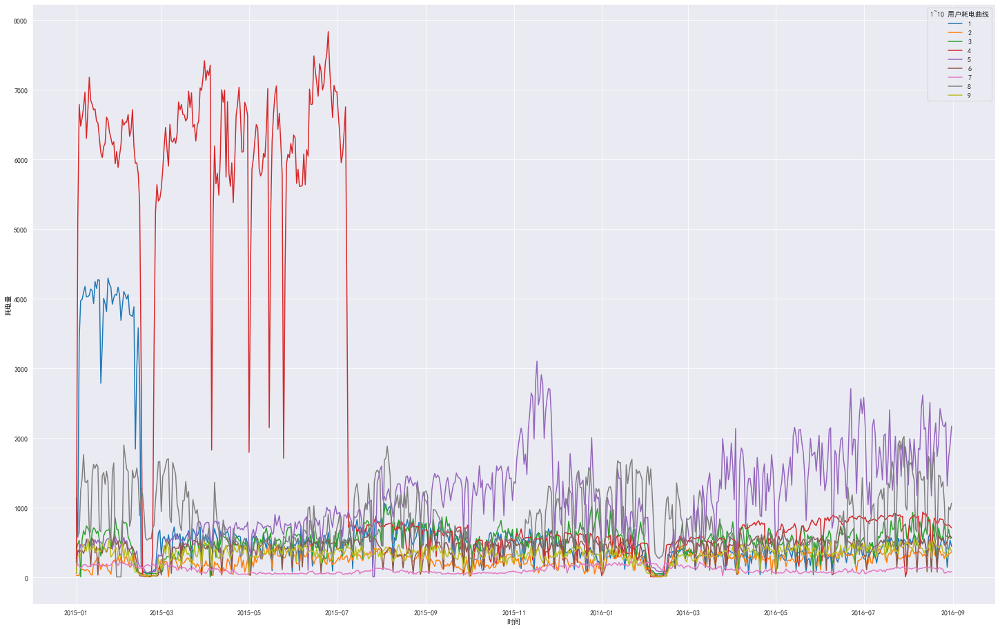

In [94]:
plt.figure(figsize=(25, 16))
for i in range(1, 10):
    df = df_initial[(df_initial['user_id']) == i]
    ts = df['power_consumption']
    plt.plot(ts, label=i)
plt.xlabel("时间")
plt.ylabel("耗电量")
plt.legend(loc='best', title="1~10 用户耗电曲线")

# 探索性数据分析

使用探索性数据分析,从不同维度探索数据



## 年
前50个用户年用电量总和折线图

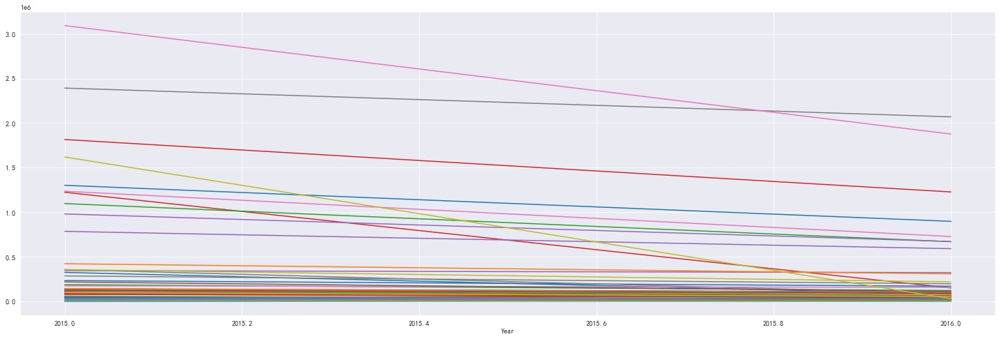

In [95]:
plt.figure(figsize=(25, 8))
for j in range(1, 50):
    df = df_initial[(df_initial['user_id']) == j]
    df.groupby('Year')['power_consumption'].sum().plot()

## 月
前50个用户月用电量总和折线图

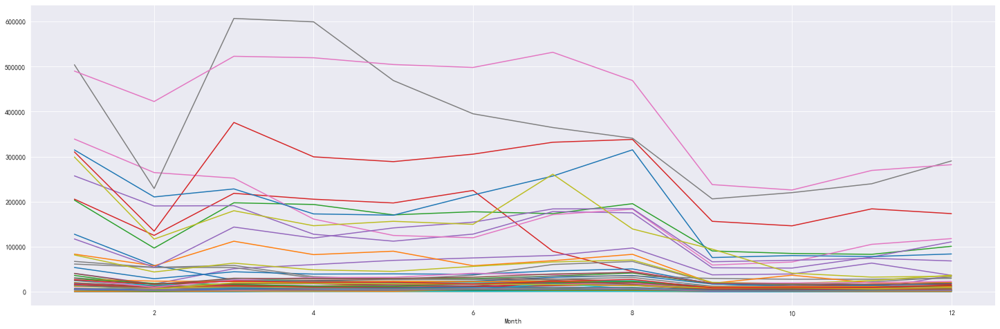

In [96]:
plt.figure(figsize=(25, 8))
for j in range(1, 50):
    df = df_initial[(df_initial['user_id']) == j]
    df.groupby('Month')['power_consumption'].sum().plot()

## 年月
前50个用户年月用电量总和折线图

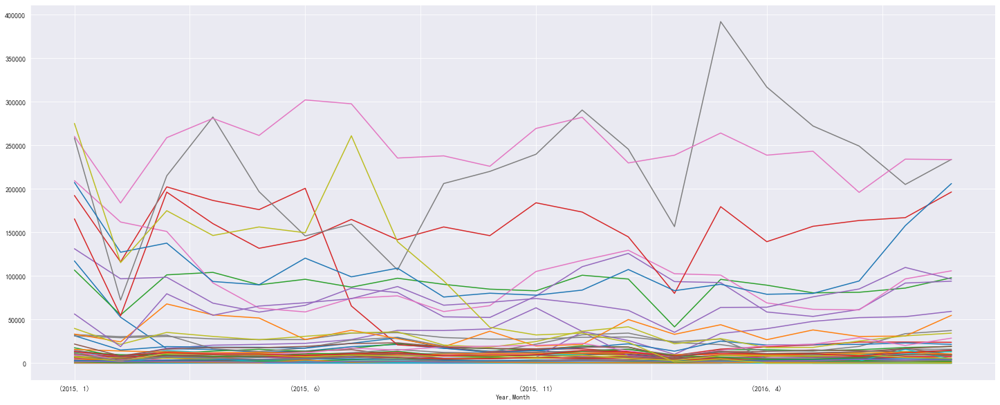

In [97]:
plt.figure(figsize=(25, 10))
for j in range(1, 50):
    df = df_initial[(df_initial['user_id']) == j]
    df.groupby(['Year', 'Month'])['power_consumption'].sum().plot()

## 日
前50个用户日用电量总和折线图

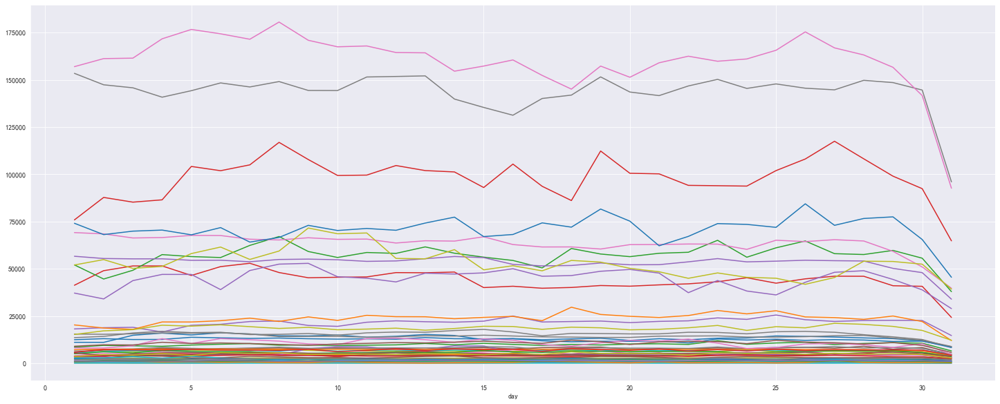

In [98]:
plt.figure(figsize=(25, 10))
for j in range(1, 50):
    df = df_initial[(df_initial['user_id']) == j]
    df.groupby('day')['power_consumption'].sum().plot()

## 是否周末
对是否是周末进行聚合,发现综合数据中**周末平均用电量比工作日少**说明**人们在周末休息时消耗更少的电量**, 所以不工作更省电

<AxesSubplot:xlabel='weekend'>

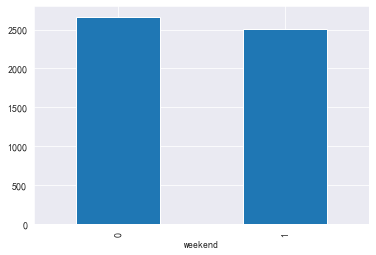

In [99]:
df_initial.groupby('weekend')['power_consumption'].mean().plot.bar()

## 周
对星期进行聚合统计，求所有数据中按是周计算的平均耗电量

<AxesSubplot:xlabel='day of the week'>

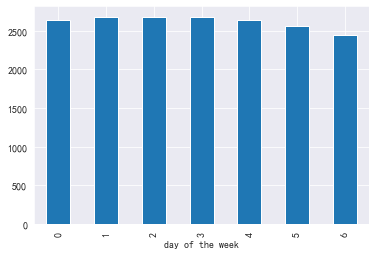

In [100]:
df_initial.groupby('day of the week')['power_consumption'].mean().plot.bar()

发现周六, 周日的用电量更少

# k-shape 聚类算法

In [101]:
df_classification = df_initial_copy[['user_id', 'record_date', 'power_consumption']]
df_classification = pd.pivot_table(data=df_classification, columns=['record_date'], values='power_consumption',
                                   index=['user_id'])

In [102]:
df_classification.head()

record_date,2015-01-01,2015-01-02,2015-01-03,2015-01-04,2015-01-05,2015-01-06,2015-01-07,2015-01-08,2015-01-09,2015-01-10,...,2016-08-22,2016-08-23,2016-08-24,2016-08-25,2016-08-26,2016-08-27,2016-08-28,2016-08-29,2016-08-30,2016-08-31
user_id,,,,,,,,,,,,,,,,,,,,,
1,1135.0,570.0,3418.0,3968.0,3986.0,4082.0,4172.0,4022.0,4025.0,4047.0,...,351.0,443.0,529.0,584.0,500.0,451.0,139.0,393.0,527.0,440.0
2,24.0,22.0,18.0,119.0,108.0,109.0,86.0,106.0,103.0,77.0,...,385.0,373.0,309.0,333.0,261.0,348.0,294.0,324.0,343.0,353.0
3,385.0,475.0,526.0,1.0,535.0,663.0,606.0,735.0,698.0,667.0,...,705.0,597.0,520.0,581.0,762.0,593.0,577.0,683.0,553.0,563.0
4,206.0,5134.0,6784.0,6475.0,6592.0,6742.0,6963.0,6301.0,6693.0,7176.0,...,788.0,838.0,826.0,825.0,750.0,748.0,744.0,750.0,729.0,707.0
5,156.0,368.0,359.0,467.0,433.0,452.0,467.0,495.0,542.0,502.0,...,1941.0,2417.0,2296.0,2175.0,2160.0,2222.0,1305.0,1719.0,1894.0,2166.0


导包

In [103]:
from tslearn.utils import to_time_series
from tslearn.clustering import KShape
from tslearn.preprocessing import TimeSeriesScalerMeanVariance

转换成符合标准的时间序列

In [104]:
time_series = to_time_series(df_classification)

In [105]:
time_series[0:5, 0:10]

array([[1.135e+03, 5.700e+02, 3.418e+03, 3.968e+03, 3.986e+03, 4.082e+03,
        4.172e+03, 4.022e+03, 4.025e+03, 4.047e+03],
       [2.400e+01, 2.200e+01, 1.800e+01, 1.190e+02, 1.080e+02, 1.090e+02,
        8.600e+01, 1.060e+02, 1.030e+02, 7.700e+01],
       [3.850e+02, 4.750e+02, 5.260e+02, 1.000e+00, 5.350e+02, 6.630e+02,
        6.060e+02, 7.350e+02, 6.980e+02, 6.670e+02],
       [2.060e+02, 5.134e+03, 6.784e+03, 6.475e+03, 6.592e+03, 6.742e+03,
        6.963e+03, 6.301e+03, 6.693e+03, 7.176e+03],
       [1.560e+02, 3.680e+02, 3.590e+02, 4.670e+02, 4.330e+02, 4.520e+02,
        4.670e+02, 4.950e+02, 5.420e+02, 5.020e+02]])

时间序列标准化,便于处理

In [106]:
time_series = TimeSeriesScalerMeanVariance(mu=0.0, std=1.0).fit_transform(time_series)

# 对两年的每天数据进行聚类

In [107]:
class KShapeClass:

    def __init__(self, data, n_clusters=4, n_init=10):
        self.sz = None
        self.ks = None
        self.y_pred = None
        self.seed = 0
        np.random.seed(self.seed)
        self.n_clusters = n_clusters
        self.n_init = n_init
        self.time_series = time_series
        self.data = data
        # kShape clustering

    def cluster(self):
        # K-Shape算法将使用不同的质心种子运行的时间。最终结果将是N_INIT连续运行的最佳输出。
        self.ks = KShape(n_clusters=self.n_clusters, n_init=self.n_init, verbose=True, random_state=self.seed)
        self.sz = self.data.shape[1]
        self.y_pred = self.ks.fit_predict(self.data)

    def draw(self):
        plt.figure(figsize=(25, 16))
        for yi in range(self.n_clusters):
            plt.subplot(self.n_clusters, 1, 1 + yi)
            for xx in self.data[self.y_pred == yi]:
                plt.plot(xx.ravel(), "k-", alpha=.2)
            plt.plot(self.ks.cluster_centers_[yi].ravel(), "r-")
            plt.xlim(0, self.sz)
            plt.ylim(-4, 4)
            plt.title("Cluster %d" % (yi + 1))
        plt.tight_layout()
        plt.show()

    def fit(self):
        self.cluster()
        self.draw()

    def to_model(self, path='./model.json'):
        self.ks.to_json(path)

    def load_model(self, path='./model.json'):
        self.ks = KShape.from_json(path)
        self.sz = self.data.shape[1]
        self.y_pred = self.ks.fit_predict(self.data)

    def only_draw(self):
        self.draw()



Init 1
0.275 --> 0.259 --> 0.254 --> 0.250 --> 0.247 --> 0.245 --> 0.244 --> 0.243 --> 0.243 --> 0.243 --> 0.243 --> 0.242 --> 0.243 --> 
Init 2
0.286 --> 0.258 --> 0.247 --> 0.244 --> 0.242 --> 0.241 --> 0.241 --> 0.241 --> 0.241 --> 
Init 3
0.250 --> 0.242 --> 0.240 --> 0.239 --> 0.239 --> 0.239 --> 
Init 4
0.280 --> 0.260 --> 0.251 --> 0.248 --> 0.245 --> 0.244 --> 0.243 --> 0.243 --> 0.243 --> 0.243 --> 0.242 --> 0.242 --> 0.242 --> 
Init 5
0.275 --> 0.263 --> 0.262 --> 0.262 --> 0.262 --> 
Init 6
0.269 --> 0.250 --> 0.245 --> 0.243 --> 0.243 --> 0.243 --> 0.243 --> 0.243 --> 
Init 7
0.255 --> 0.241 --> 0.240 --> 0.240 --> 0.240 --> 
Init 8
0.268 --> 0.252 --> 0.244 --> 0.243 --> 0.242 --> 0.243 --> 
Init 9
0.268 --> 0.253 --> 0.244 --> 0.241 --> 0.240 --> 0.240 --> 0.241 --> 
Init 10
0.282 --> 0.268 --> 0.260 --> 0.251 --> 0.245 --> 0.243 --> 0.242 --> 0.242 --> 0.241 --> 0.241 --> 0.241 --> 0.241 --> 


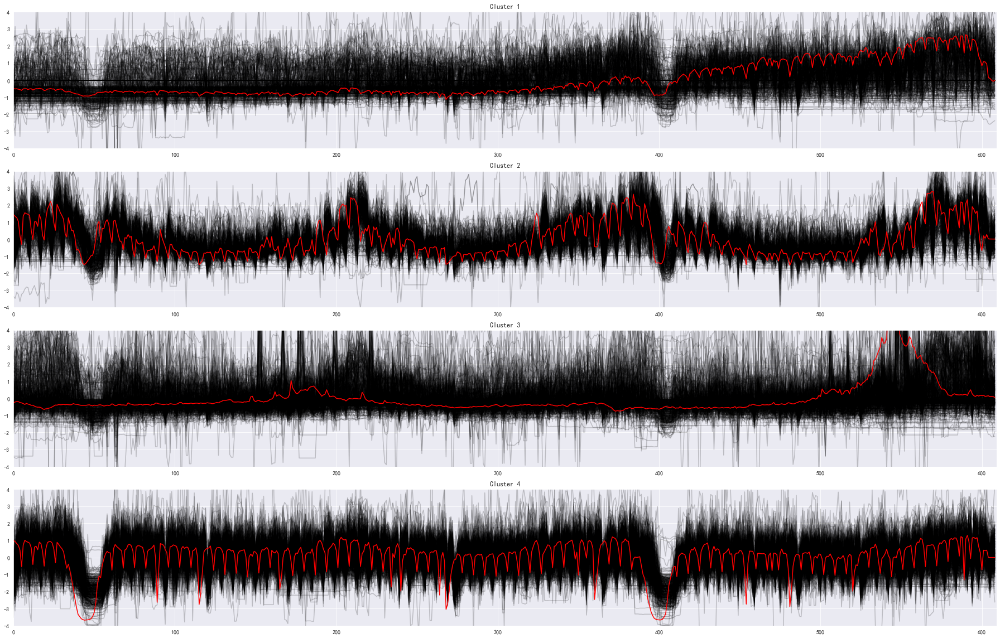

In [108]:
power_clusters = KShapeClass(data=time_series,n_clusters=4, n_init=10 )

#直接预测, 并生成模型
power_clusters.fit()
power_clusters.to_model('./model_01.json')

# 加载模型方式运行
# power_clusters.load_model('./model_01.json')
# power_clusters.only_draw()


## 分析

1. 我们发现大量用户的用电量缓慢升高, 可能是随着经济的发展, 购置了更多的电器, 标志着生活水平的提高

2. 发现第二类用户在每年七八月份, 用电量大幅升高, 因为夏季到来, 使用空调等大功率电器导致的

3. 第二年夏季用电量高, 说明在第二年使用了高功率电器

4. 从两年的数据中, 我们明显地发现在每年的二月用电量会大幅下降

   这是因为每年春节月份的用电量都是下降的, 因为大多数企业处于停产或者半停产状态, 所以二月用电量会出现大量下滑
   整年中用电来回波动, 用户可能工作时间较为规律, 导致用电量呈现规律性变化



## 取第一年数据

In [109]:
first_year_end_index = df_classification.columns.get_loc('2015-12-31') + 1
frist_year_data = df_classification.iloc[:, :first_year_end_index]

In [110]:
frist_year_data.head()

record_date,2015-01-01,2015-01-02,2015-01-03,2015-01-04,2015-01-05,2015-01-06,2015-01-07,2015-01-08,2015-01-09,2015-01-10,...,2015-12-22,2015-12-23,2015-12-24,2015-12-25,2015-12-26,2015-12-27,2015-12-28,2015-12-29,2015-12-30,2015-12-31
user_id,,,,,,,,,,,,,,,,,,,,,
1,1135.0,570.0,3418.0,3968.0,3986.0,4082.0,4172.0,4022.0,4025.0,4047.0,...,68.0,381.0,421.0,349.0,353.0,239.0,334.0,213.0,228.0,113.0
2,24.0,22.0,18.0,119.0,108.0,109.0,86.0,106.0,103.0,77.0,...,76.0,92.0,251.0,167.0,249.0,46.0,121.0,212.0,118.0,174.0
3,385.0,475.0,526.0,1.0,535.0,663.0,606.0,735.0,698.0,667.0,...,288.0,704.0,898.0,1017.0,638.0,748.0,855.0,979.0,836.0,658.0
4,206.0,5134.0,6784.0,6475.0,6592.0,6742.0,6963.0,6301.0,6693.0,7176.0,...,190.0,425.0,625.0,606.0,541.0,486.0,548.0,583.0,565.0,202.0
5,156.0,368.0,359.0,467.0,433.0,452.0,467.0,495.0,542.0,502.0,...,396.0,1122.0,1478.0,1999.0,1454.0,1083.0,1202.0,1123.0,1142.0,670.0


第一年数据聚类

In [111]:
first_year_time_series = to_time_series(frist_year_data)
first_year_time_series = TimeSeriesScalerMeanVariance(mu=0.0, std=1.0).fit_transform(first_year_time_series)


0.300 --> 0.283 --> 0.280 --> 0.279 --> 0.279 --> 0.280 --> 


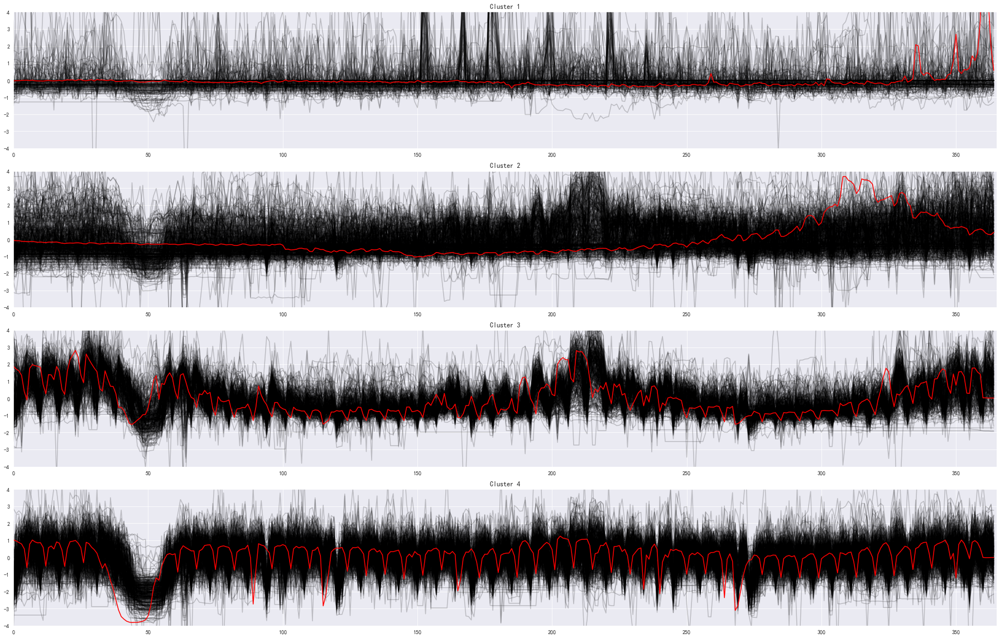

In [112]:
first_power_clusters = KShapeClass(first_year_time_series, 4, 1)
#直接预测, 并生成模型
first_power_clusters.fit()
first_power_clusters.to_model('./model_02.json')

# 加载模型方式运行
# first_power_clusters.load_model('./model_02.json')
# first_power_clusters.only_draw()


## 分析
1. 一年中用电量平稳, 节约用电
2. 七八月份用电升高, 夏季使用大功率电器
3. 春节用电大幅下降, 夏季用电量升高, 有可能是企业用户, 春季半停产, 夏季使用大规模制冷设备
4. 按时放假的企业或者政府部门, 用电量呈现规律波动, 波峰上班, 波谷放假

## 取第二年的数据

In [113]:
second_year_start_index = df_classification.columns.get_loc('2015-12-31') + 1
second_year_data = df_classification.iloc[:, second_year_start_index:]
second_year_time_series = to_time_series(second_year_data)
second_year_time_series = TimeSeriesScalerMeanVariance(mu=0.0, std=1.0).fit_transform(second_year_time_series)

Init 1
0.236 --> 0.230 --> 0.225 --> 0.219 --> 0.215 --> 0.211 --> 0.206 --> 0.203 --> 0.202 --> 0.202 --> 0.202 --> 
Init 2
0.262 --> 0.249 --> 0.237 --> 0.213 --> 0.205 --> 0.203 --> 0.202 --> 0.203 --> 
Init 3
0.234 --> 0.221 --> 0.212 --> 0.209 --> 0.207 --> 0.205 --> 0.205 --> 
Init 4
0.221 --> 0.216 --> 0.213 --> 0.213 --> 0.213 --> 0.213 --> 
Init 5
0.222 --> 0.215 --> 0.211 --> 0.208 --> 0.205 --> 0.205 --> 0.205 --> 
Init 6
0.226 --> 0.211 --> 0.208 --> 0.207 --> 0.205 --> 0.203 --> 0.202 --> 0.202 --> 0.202 --> 
Init 7
0.212 --> 0.203 --> 0.202 --> 0.202 --> 0.202 --> 
Init 8
0.224 --> 0.216 --> 0.211 --> 0.208 --> 0.207 --> 0.207 --> 0.207 --> 0.207 --> 0.206 --> 0.205 --> 0.205 --> 
Init 9
0.234 --> 0.216 --> 0.211 --> 0.210 --> 0.210 --> 
Init 10
0.251 --> 0.233 --> 0.225 --> 0.218 --> 0.214 --> 0.212 --> 0.211 --> 0.211 --> 0.211 --> 0.211 --> 0.211 --> 


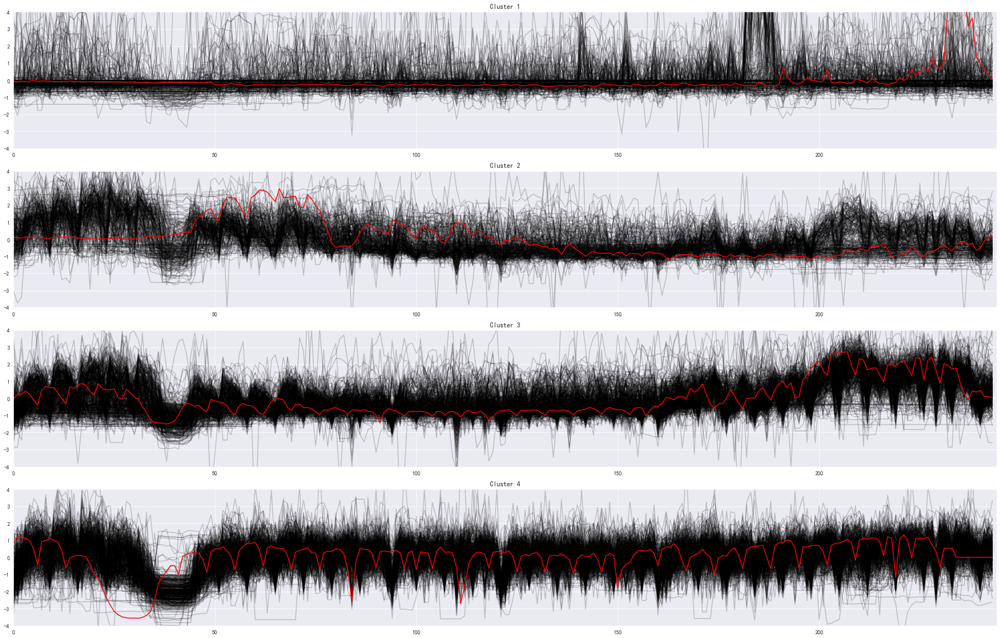

In [114]:
second_power_clusters = KShapeClass(second_year_time_series,4, 10 )
#直接预测, 并生成模型
second_power_clusters.fit()
second_power_clusters.to_model('./model_03.json')

# 加载模型方式运行
# second_power_clusters.load_model('./model_03.json')
# second_power_clusters.only_draw()


## 对第一年数据进行年月聚类分析

去每个用户第一年原始数据, 并对数据表进行透视, 以月份作为行索引

通过id和月份进行分组, 在进行透视表转换

In [115]:
df = df_initial[df_initial['record_date'] < '2016-01-01']
df = pd.pivot_table(data=df, columns=['Month'], values=['power_consumption'], index=['user_id'], aggfunc=np.mean)
df.head()

power_consumption                                                      \
Month                  1            2            3            4            5    
user_id                                                                         
1             3782.967742  1882.821429   536.322581   526.133333   406.193548   
2              140.806452   120.285714   194.838710   157.100000   295.709677   
3              569.967742   243.750000   347.645161   462.600000   513.322581   
4             6204.225806  4149.392857  6524.129032  6222.033333  5681.548387   
5              474.129032   252.821429   547.580645   688.533333   695.064516   

                                                                          \
Month             6            7            8            9            10   
user_id                                                                    
1         459.866667   610.000000   695.096774   567.566667   442.419355   
2         271.233333   307.806452   304.354839   172.133333   194.838710   
3         454.800000   547.419355   723.032258   604.100000   538.903226   
4        6685.366667  2116.677419   677.870968   609.633333   398.612903   
5         758.700000   873.000000  1213.193548  1248.300000  1269.741935   

                                   
Month             11           12  
user_id                            
1         481.833333   342.258065  
2         184.600000   192.806452  
3         499.100000   641.774194  
4         538.900000   530.935484  
5        2117.733333  1174.129032

## 对年数据进行聚类

归一化

In [116]:
data = to_time_series(df)
data = TimeSeriesScalerMeanVariance(mu=0.0, std=1.0).fit_transform(data)

训练并保存模型

Init 1
0.224 --> 0.237 --> 
Init 2
0.243 --> 0.258 --> 
Init 3
Resumed because of empty cluster
Init 3
0.212 --> 0.239 --> 
Init 4
0.231 --> 0.241 --> 
Init 5
0.230 --> 0.216 --> 0.234 --> 
Init 6
0.242 --> 0.239 --> 0.233 --> 0.222 --> 0.236 --> 
Init 7
0.251 --> 0.252 --> 
Init 8
0.215 --> 0.233 --> 
Init 9
0.237 --> 0.232 --> 0.229 --> 0.222 --> 0.221 --> 0.242 --> 


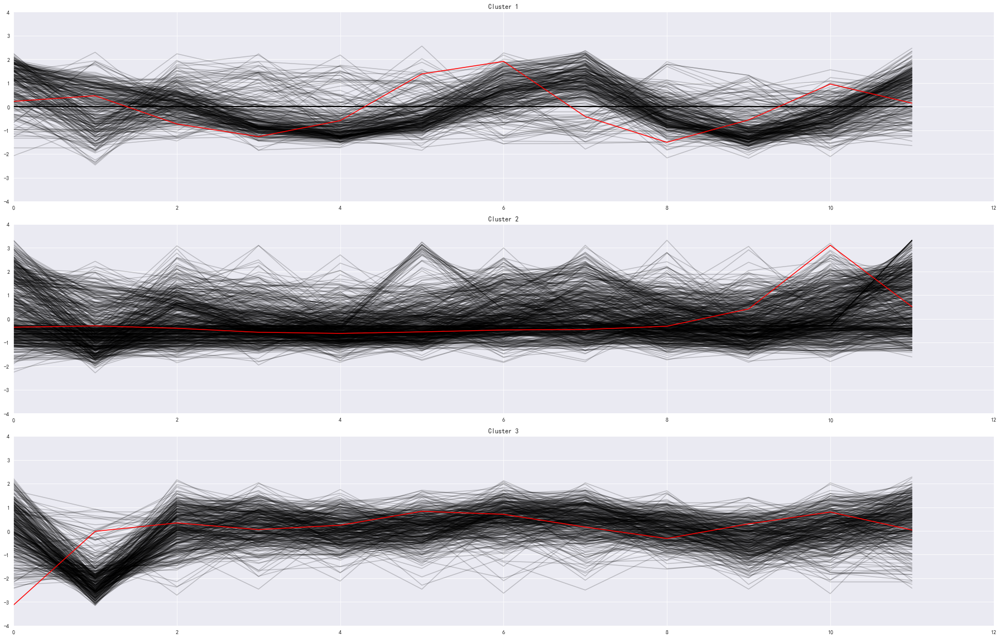

In [117]:
clu = KShapeClass(data, 3, 10)
clu.fit()
clu.to_model('./model.json')

## 分析

1. 用电量随季节波动, 冬季用电量升高, 处于波峰位置, 春季期间用电量大幅下降
2. 只有夏季用电量升高, 夏季使用制冷设备
3. 一年中用电平稳, 节约用电

加载已有模型, 并进行预测

In [118]:
# clu = KShapeClass(data=data)  # 后两个参数在加载模型预测时无影响
# clu.load_model("./model.json")
# clu.only_draw()